In [1]:
!pip install fastai
!pip install boto3
!pip install tqdm
!pip install timm==0.5.4
!pip install wandb
!pip install split-folders
!pip install gdown --upgrade
!pip install fastai==2.5.2 fastcore==1.3.26
!pip install torch==1.9.0+cu111 torchvision==0.10.0+cu111 torchaudio==0.9.0 -f https://download.pytorch.org/whl/torch_stable.html
!pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.8/135.8 kB 3.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.2/11.2 MB 32.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.8/79.8 kB 11.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.1/143.1 kB 18.9 MB/s eta 0:00:00
  Attempting uninstall: urllib3
    Found existing installation: urllib3 2.0.4
    Uninstalling urllib3-2.0.4:
      Successfully uninstalled urllib3-2.0.4
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 431.5/431.5 kB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 16.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.0/190.0 kB 24.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.8/224.8 kB 24.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.8 MB/s eta 0:00:00
  Created wheel for pathtools: filename=pathtools-0.1.2-py3-none-any.whl size

In [2]:
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


In [3]:
from PIL import Image
import os
import numpy as np
import matplotlib.pyplot as plt
import torch
from fastai.vision.all import *
from fastai import *
import timm

import shap

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


In [4]:
path = "/content/drive/MyDrive/SkinDisease/ShapTest"
bs = 12
sz = 224

data = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    get_y= parent_label,
    splitter= GrandparentSplitter(train_name = "train",valid_name = "test"),
    item_tfms=Resize(224))
    #batch_tfms=aug_transforms(size=224, min_scale=0.75))

dls = data.dataloaders(path, bs=bs,seed = 42,shuffle = True)
print("Number of classes: ",dls.c)

del data

Number of classes:  31


In [5]:
# pull a sample of our data (128 images)
batch = dls.one_batch()

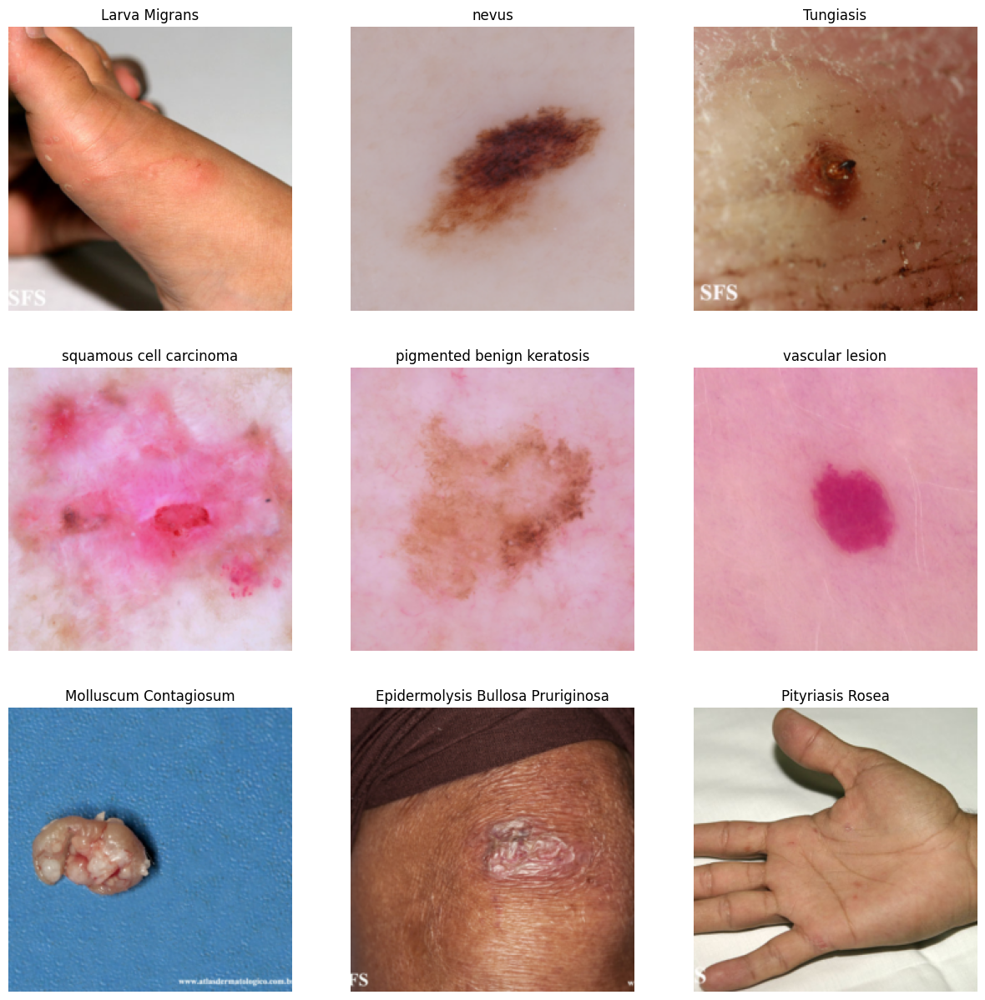

In [6]:
# Visualize the batch
dls.show_batch(b=batch, figsize=(15, 15))

## Swin Transformers Unaugmented

In [8]:
arch = "swin_base_patch4_window7_224_in22k"
model = timm.create_model(arch, pretrained=False, in_chans=3, num_classes=dls.c)
learn = Learner(dls, model, metrics=[accuracy,Precision(average='macro'), Recall(average='macro'), F1Score(average='macro')])
learn.load("/content/drive/MyDrive/SkinDisease/swin_timm_unaug")

Saved filed doesn't contain an optimizer state.


In [9]:
preds = learn.get_preds()
pred_class = preds[0].max(1).indices
tgts = preds[1]

for i, name in enumerate(dls.train.vocab):
    idx = torch.nonzero(tgts==i)
    subset = (tgts == pred_class)[idx]
    acc = subset.squeeze().float().mean()
    print(f'{name}: {acc:.1%}')

Basal Cell Carcinoma: 92.9%
Darier_s Disease: 75.0%
Epidermolysis Bullosa Pruriginosa: 95.0%
Hailey-Hailey Disease: 82.8%
Herpes Simplex: 72.2%
Impetigo: 81.8%
Larva Migrans: 92.9%
Leprosy Borderline: 48.3%
Leprosy Lepromatous: 78.0%
Leprosy Tuberculoid: 78.7%
Lichen Planus: 92.6%
Lupus Erythematosus Chronicus Discoides: 82.6%
Melanoma: 96.2%
Molluscum Contagiosum: 88.9%
Mycosis Fungoides: 70.8%
Neurofibromatosis: 100.0%
Papilomatosis Confluentes And Reticulate: 94.4%
Pediculosis Capitis: 94.1%
Pityriasis Rosea: 76.9%
Porokeratosis Actinic: 100.0%
Psoriasis: 88.9%
Tinea Corporis: 73.9%
Tinea Nigra: 91.7%
Tungiasis: 100.0%
actinic keratosis: 30.8%
dermatofibroma: 60.9%
nevus: 64.0%
pigmented benign keratosis: 90.6%
seborrheic keratosis: 87.5%
squamous cell carcinoma: 87.5%
vascular lesion: 89.7%


In [10]:
# specify how many images to use when creating the background distribution
num_samples = 6
explainer = shap.GradientExplainer(
    learn.model, batch[0][:num_samples]
)

# calculate shapely values
shap_values = explainer.shap_values(
    batch[0][num_samples:]
)

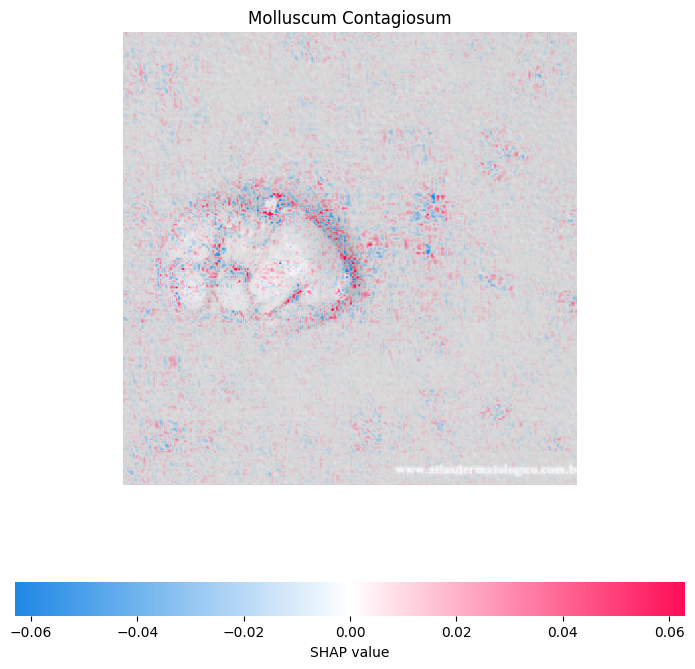

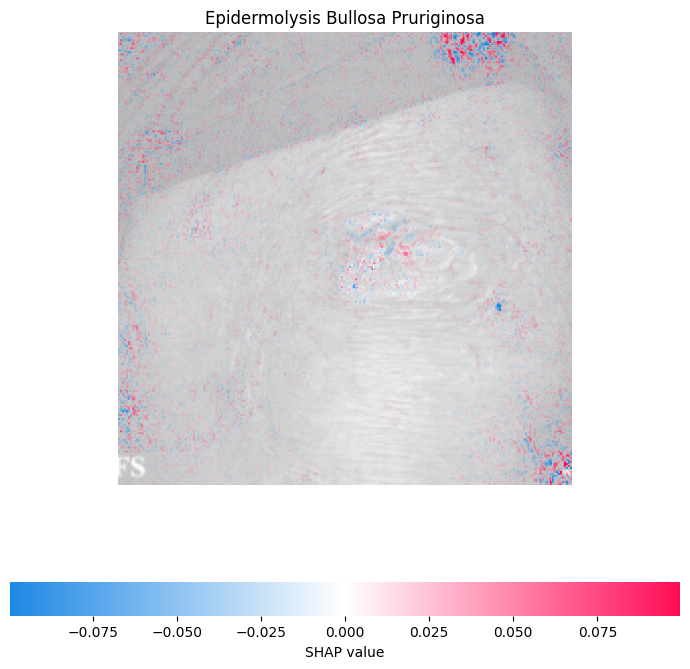

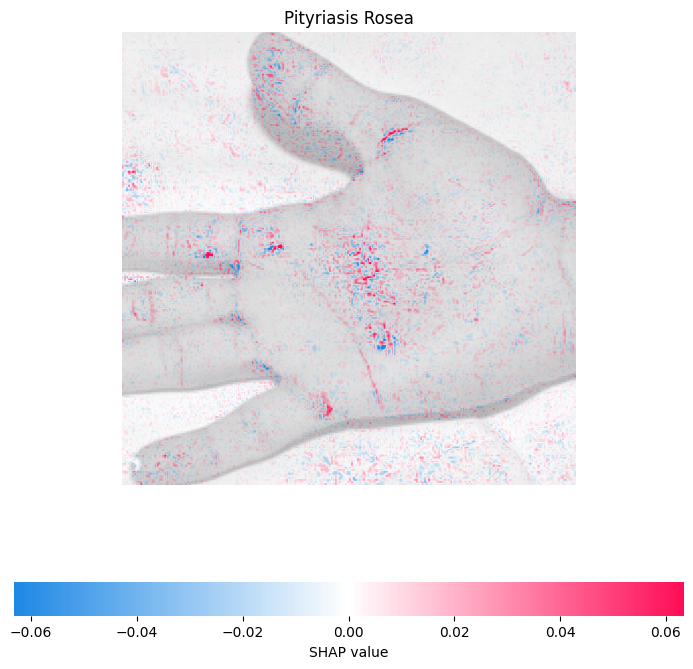

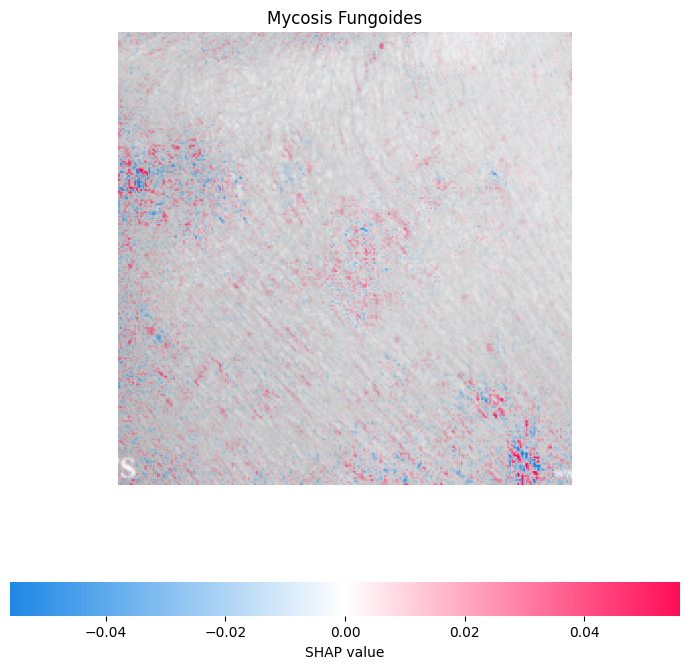

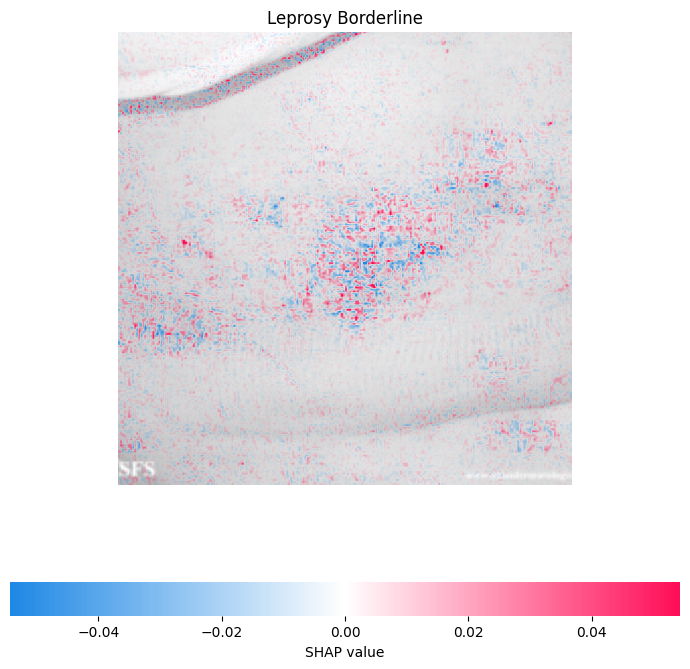

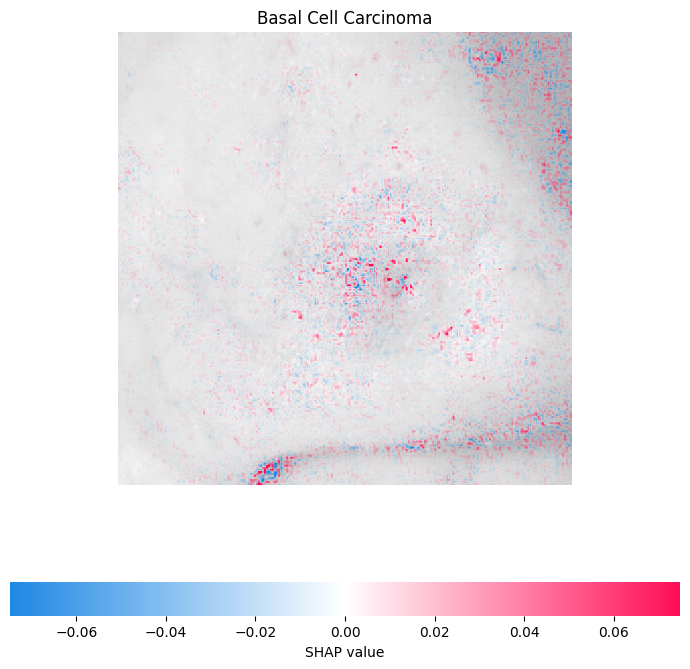

In [13]:
import gc
del model, learn
gc.collect()

22794

## Swin Aug

In [42]:
!pip install timm fastai
! pip install -U accelerate

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 258.1/258.1 kB 4.4 MB/s eta 0:00:00


In [44]:
arch = "swin_base_patch4_window7_224"
model = timm.create_model(arch, pretrained=False, in_chans=3, num_classes=dls.c)
learn = Learner(dls, model, metrics=[accuracy,Precision(average='macro'), Recall(average='macro'), F1Score(average='macro')])
learn.load("/content/drive/MyDrive/SkinDisease/swin_timm_aug")

RuntimeError: ignored

## VIT UnAug

In [16]:
arch = "vit_base_patch16_224"
model = timm.create_model(arch, pretrained=False, in_chans=3, num_classes=dls.c)
learn = Learner(dls, model, metrics=[accuracy,Precision(average='macro'), Recall(average='macro'), F1Score(average='macro')])
learn.load("/content/drive/MyDrive/SkinDisease/vit_timm_unaug")

Saved filed doesn't contain an optimizer state.


In [17]:
preds = learn.get_preds()
pred_class = preds[0].max(1).indices
tgts = preds[1]

for i, name in enumerate(dls.train.vocab):
    idx = torch.nonzero(tgts==i)
    subset = (tgts == pred_class)[idx]
    acc = subset.squeeze().float().mean()
    print(f'{name}: {acc:.1%}')

Basal Cell Carcinoma: 95.2%
Darier_s Disease: 95.0%
Epidermolysis Bullosa Pruriginosa: 85.0%
Hailey-Hailey Disease: 86.2%
Herpes Simplex: 83.3%
Impetigo: 81.8%
Larva Migrans: 96.4%
Leprosy Borderline: 82.8%
Leprosy Lepromatous: 89.8%
Leprosy Tuberculoid: 87.2%
Lichen Planus: 88.9%
Lupus Erythematosus Chronicus Discoides: 91.3%
Melanoma: 92.3%
Molluscum Contagiosum: 77.8%
Mycosis Fungoides: 91.7%
Neurofibromatosis: 94.4%
Papilomatosis Confluentes And Reticulate: 88.9%
Pediculosis Capitis: 94.1%
Pityriasis Rosea: 96.2%
Porokeratosis Actinic: 100.0%
Psoriasis: 92.6%
Tinea Corporis: 95.7%
Tinea Nigra: 91.7%
Tungiasis: 100.0%
actinic keratosis: 19.2%
dermatofibroma: 95.7%
nevus: 52.0%
pigmented benign keratosis: 85.4%
seborrheic keratosis: 93.8%
squamous cell carcinoma: 80.0%
vascular lesion: 96.6%


In [18]:
# specify how many images to use when creating the background distribution
num_samples = 6
explainer = shap.GradientExplainer(
    learn.model, batch[0][:num_samples]
)

# calculate shapely values
shap_values = explainer.shap_values(
    batch[0][num_samples:]
)

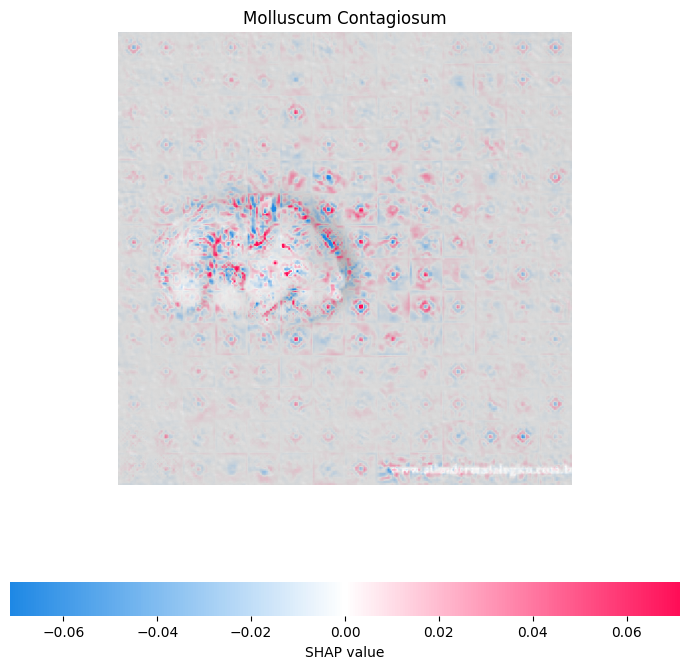

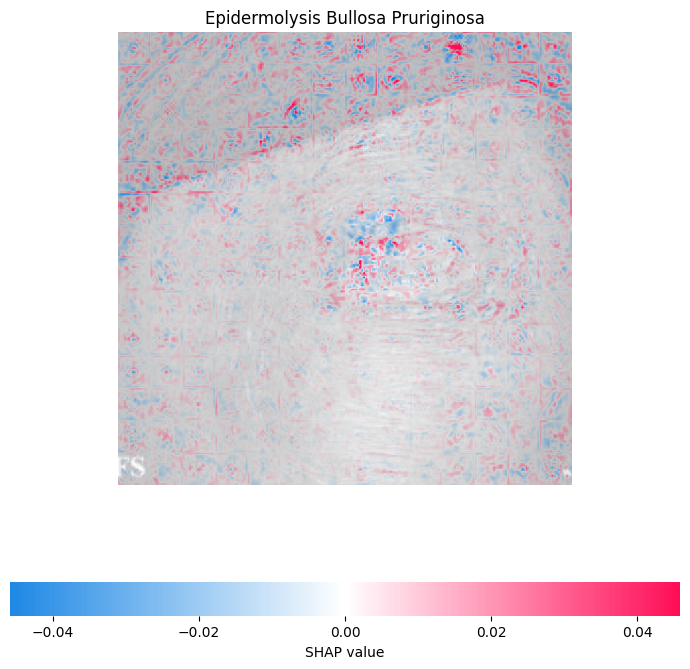

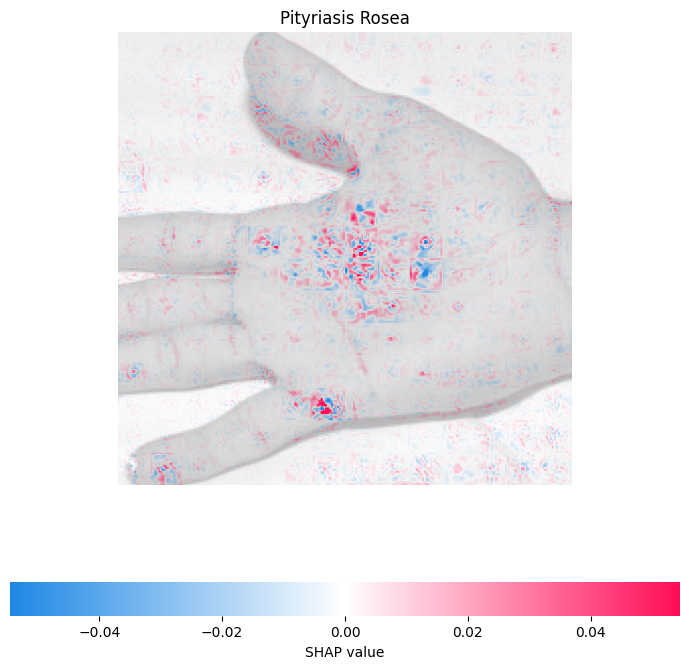

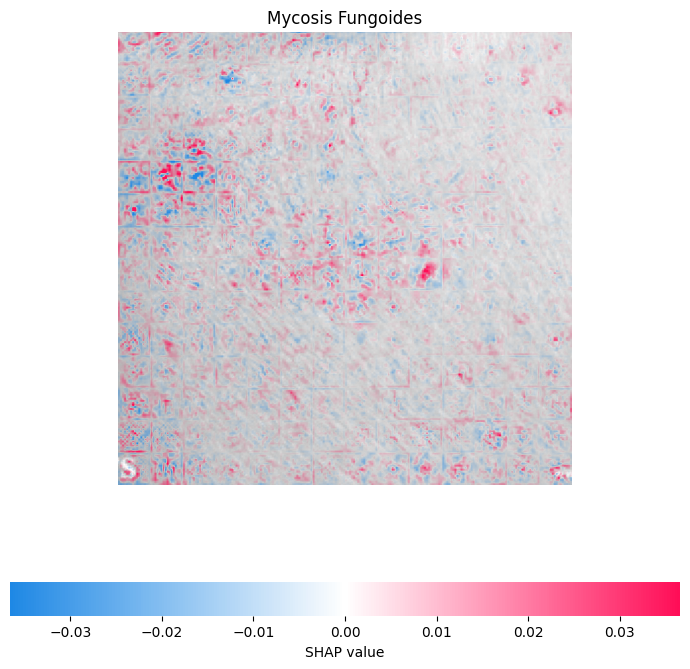

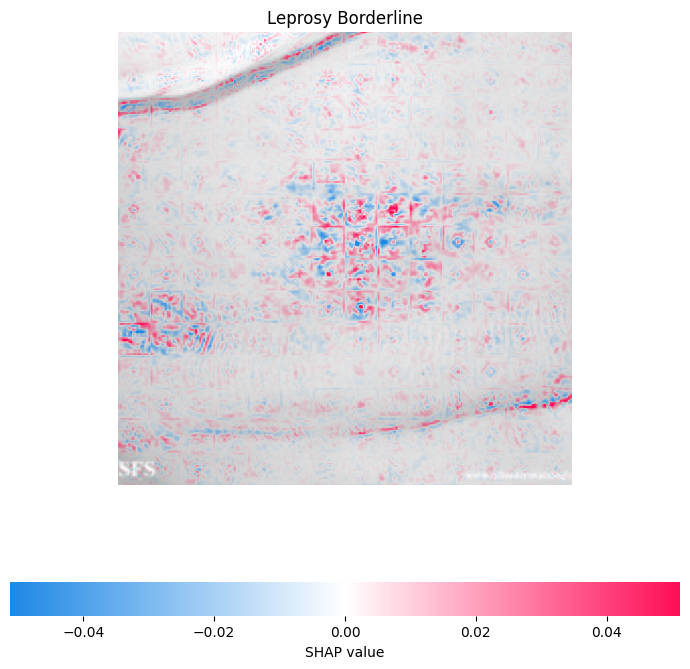

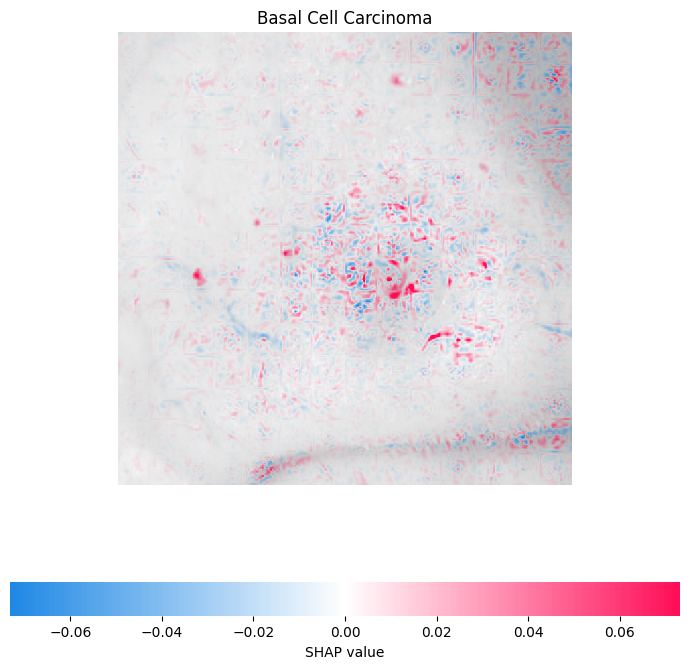

In [19]:
import matplotlib.pyplot as pl
from shap.plots import colors

for idx, x in enumerate(batch[0][num_samples:]):
    label = dls.train.vocab[batch[1][num_samples:]][idx]
    sv_idx = list(dls.train.vocab).index(label)

    # plot our explanations
    fig, axes = pl.subplots(figsize=(7, 7))

    # make sure we have a 2D array for grayscale
    if len(x.shape) == 3 and x.shape[2] == 1:
        x = x.reshape(x.shape[:2])
    if x.max() > 1:
        x /= 255.

    # get a grayscale version of the image
    x_curr_gray = (
        0.2989 * x[0,:,:] +
        0.5870 * x[1,:,:] +
        0.1140 * x[2,:,:]
    )
    x_curr_disp = x

    abs_vals = np.stack(
        [np.abs(shap_values[sv_idx][idx].sum(0))], 0
    ).flatten()
    max_val = np.nanpercentile(abs_vals, 99.9)

    label_kwargs = {'fontsize': 12}
    axes.set_title(label, **label_kwargs)

    sv = shap_values[sv_idx][idx].sum(0)
    axes.imshow(
        x_curr_gray.cpu(),
        cmap=pl.get_cmap('gray'),
        alpha=0.3,
        extent=(-1, sv.shape[1], sv.shape[0], -1)
    )
    im = axes.imshow(
        sv,
        cmap=colors.red_transparent_blue,
        vmin=-max_val,
        vmax=max_val
    )
    axes.axis('off')

    fig.tight_layout()

    cb = fig.colorbar(
        im,
        ax=np.ravel(axes).tolist(),
        label="SHAP value",
        orientation="horizontal"
    )
    cb.outline.set_visible(False)
    pl.show()

In [20]:
import gc
del model, learn
gc.collect()

48843

## VIT Augmented

In [21]:
arch = "vit_base_patch16_224"
model = timm.create_model(arch, pretrained=False, in_chans=3, num_classes=dls.c)
learn = Learner(dls, model, metrics=[accuracy,Precision(average='macro'), Recall(average='macro'), F1Score(average='macro')])
learn.load("/content/drive/MyDrive/SkinDisease/vit_timm_aug")

In [22]:
preds = learn.get_preds()
pred_class = preds[0].max(1).indices
tgts = preds[1]

for i, name in enumerate(dls.train.vocab):
    idx = torch.nonzero(tgts==i)
    subset = (tgts == pred_class)[idx]
    acc = subset.squeeze().float().mean()
    print(f'{name}: {acc:.1%}')

Basal Cell Carcinoma: 95.2%
Darier_s Disease: 80.0%
Epidermolysis Bullosa Pruriginosa: 85.0%
Hailey-Hailey Disease: 100.0%
Herpes Simplex: 88.9%
Impetigo: 72.7%
Larva Migrans: 89.3%
Leprosy Borderline: 79.3%
Leprosy Lepromatous: 88.1%
Leprosy Tuberculoid: 87.2%
Lichen Planus: 88.9%
Lupus Erythematosus Chronicus Discoides: 91.3%
Melanoma: 96.2%
Molluscum Contagiosum: 85.2%
Mycosis Fungoides: 91.7%
Neurofibromatosis: 94.4%
Papilomatosis Confluentes And Reticulate: 100.0%
Pediculosis Capitis: 100.0%
Pityriasis Rosea: 73.1%
Porokeratosis Actinic: 96.2%
Psoriasis: 85.2%
Tinea Corporis: 73.9%
Tinea Nigra: 95.8%
Tungiasis: 100.0%
actinic keratosis: 46.2%
dermatofibroma: 95.7%
nevus: 64.0%
pigmented benign keratosis: 84.4%
seborrheic keratosis: 93.8%
squamous cell carcinoma: 77.5%
vascular lesion: 96.6%


In [23]:
# specify how many images to use when creating the background distribution
num_samples = 6
explainer = shap.GradientExplainer(
    learn.model, batch[0][:num_samples]
)

# calculate shapely values
shap_values = explainer.shap_values(
    batch[0][num_samples:]
)

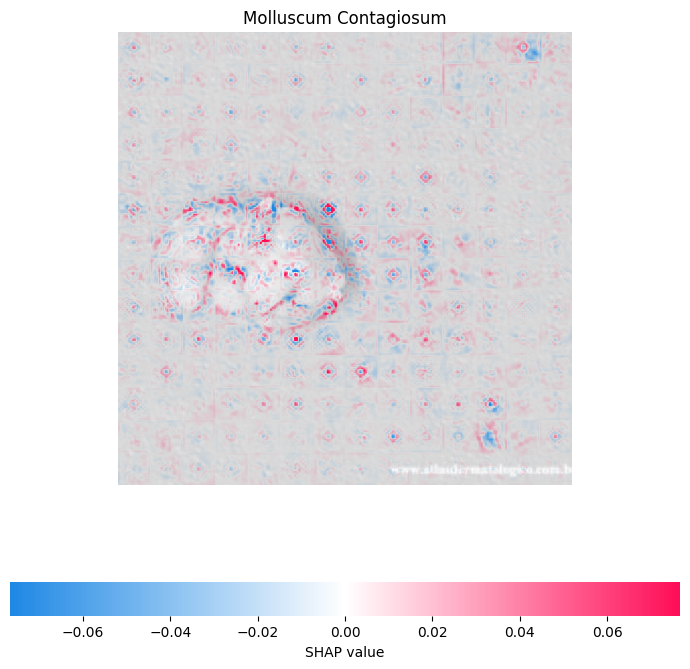

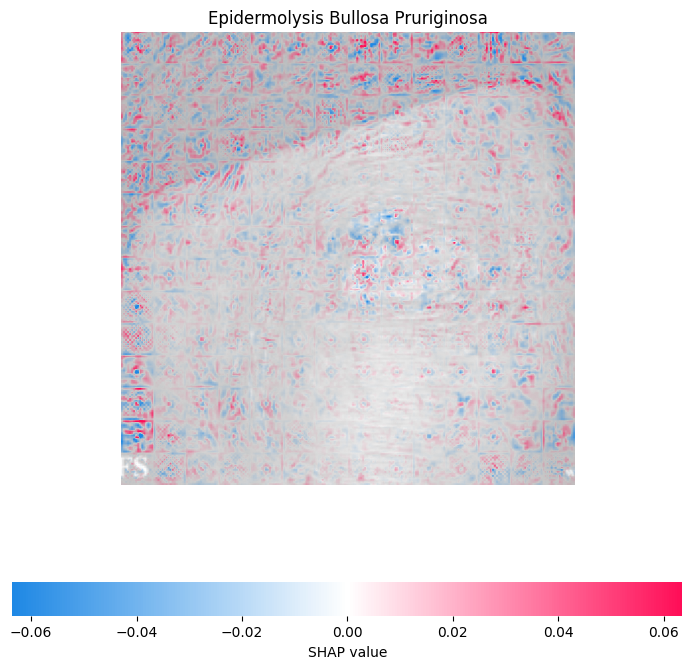

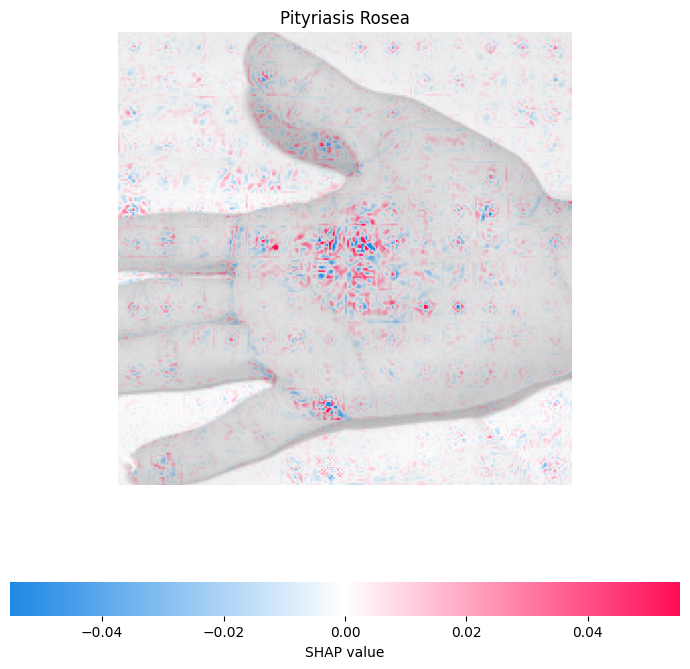

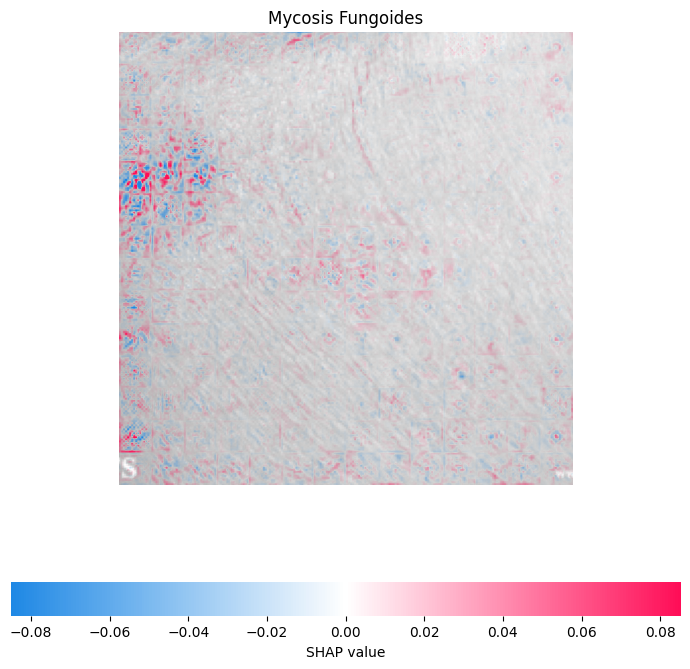

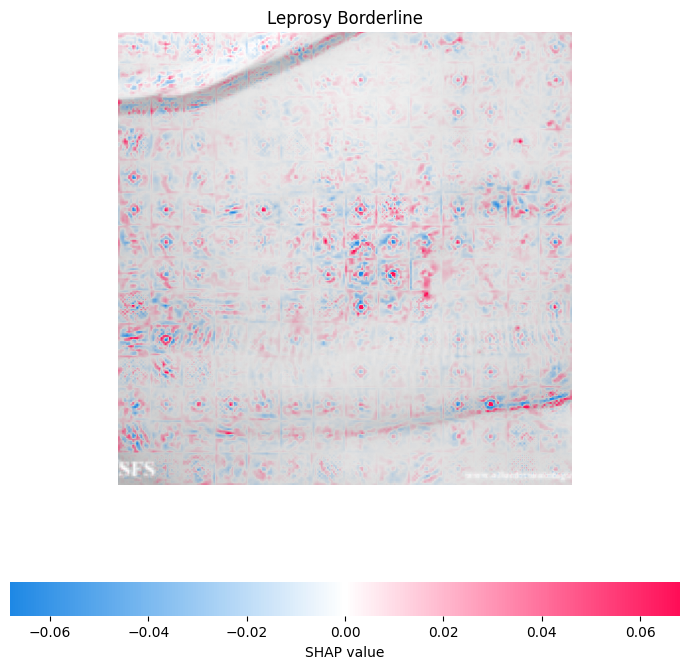

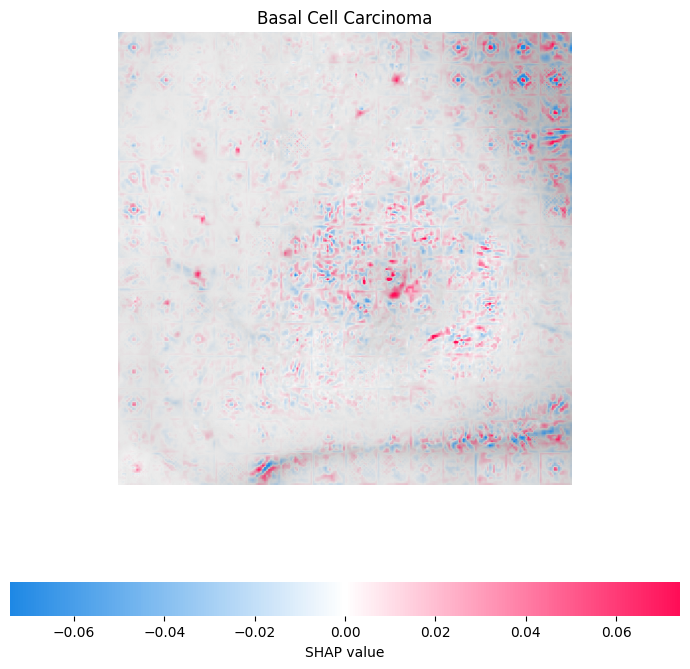

In [24]:
import matplotlib.pyplot as pl
from shap.plots import colors

for idx, x in enumerate(batch[0][num_samples:]):
    label = dls.train.vocab[batch[1][num_samples:]][idx]
    sv_idx = list(dls.train.vocab).index(label)

    # plot our explanations
    fig, axes = pl.subplots(figsize=(7, 7))

    # make sure we have a 2D array for grayscale
    if len(x.shape) == 3 and x.shape[2] == 1:
        x = x.reshape(x.shape[:2])
    if x.max() > 1:
        x /= 255.

    # get a grayscale version of the image
    x_curr_gray = (
        0.2989 * x[0,:,:] +
        0.5870 * x[1,:,:] +
        0.1140 * x[2,:,:]
    )
    x_curr_disp = x

    abs_vals = np.stack(
        [np.abs(shap_values[sv_idx][idx].sum(0))], 0
    ).flatten()
    max_val = np.nanpercentile(abs_vals, 99.9)

    label_kwargs = {'fontsize': 12}
    axes.set_title(label, **label_kwargs)

    sv = shap_values[sv_idx][idx].sum(0)
    axes.imshow(
        x_curr_gray.cpu(),
        cmap=pl.get_cmap('gray'),
        alpha=0.3,
        extent=(-1, sv.shape[1], sv.shape[0], -1)
    )
    im = axes.imshow(
        sv,
        cmap=colors.red_transparent_blue,
        vmin=-max_val,
        vmax=max_val
    )
    axes.axis('off')

    fig.tight_layout()

    cb = fig.colorbar(
        im,
        ax=np.ravel(axes).tolist(),
        label="SHAP value",
        orientation="horizontal"
    )
    cb.outline.set_visible(False)
    pl.show()

In [25]:
del model, learn
gc.collect()

34772

## EfficientNetB2 Unaug

In [29]:
arch = "efficientnet_b2"
model = timm.create_model(arch, pretrained=False, in_chans=3, num_classes=dls.c)
learn = Learner(dls, model, metrics=[accuracy,Precision(average='macro'), Recall(average='macro'), F1Score(average='macro')])
learn.load("/content/drive/MyDrive/SkinDisease/efficientnet_unaug")

In [30]:
preds = learn.get_preds()
pred_class = preds[0].max(1).indices
tgts = preds[1]

for i, name in enumerate(dls.train.vocab):
    idx = torch.nonzero(tgts==i)
    subset = (tgts == pred_class)[idx]
    acc = subset.squeeze().float().mean()
    print(f'{name}: {acc:.1%}')

Basal Cell Carcinoma: 47.6%
Darier_s Disease: 60.0%
Epidermolysis Bullosa Pruriginosa: 55.0%
Hailey-Hailey Disease: 51.7%
Herpes Simplex: 55.6%
Impetigo: 59.1%
Larva Migrans: 42.9%
Leprosy Borderline: 48.3%
Leprosy Lepromatous: 79.7%
Leprosy Tuberculoid: 36.2%
Lichen Planus: 66.7%
Lupus Erythematosus Chronicus Discoides: 60.9%
Melanoma: 76.9%
Molluscum Contagiosum: 51.9%
Mycosis Fungoides: 45.8%
Neurofibromatosis: 77.8%
Papilomatosis Confluentes And Reticulate: 66.7%
Pediculosis Capitis: 94.1%
Pityriasis Rosea: 73.1%
Porokeratosis Actinic: 73.1%
Psoriasis: 77.8%
Tinea Corporis: 56.5%
Tinea Nigra: 87.5%
Tungiasis: 88.9%
actinic keratosis: 11.5%
dermatofibroma: 34.8%
nevus: 46.7%
pigmented benign keratosis: 87.5%
seborrheic keratosis: 68.8%
squamous cell carcinoma: 22.5%
vascular lesion: 96.6%


In [31]:
# specify how many images to use when creating the background distribution
num_samples = 6
explainer = shap.GradientExplainer(
    learn.model, batch[0][:num_samples]
)

# calculate shapely values
shap_values = explainer.shap_values(
    batch[0][num_samples:]
)

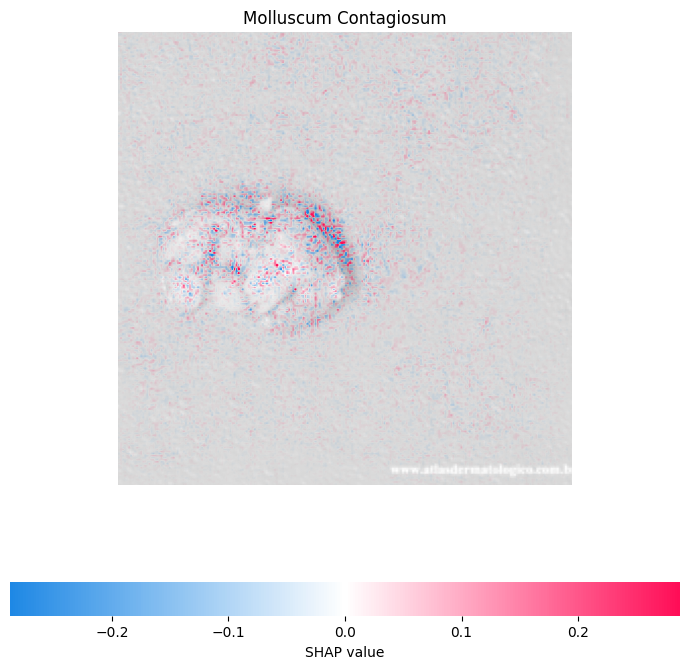

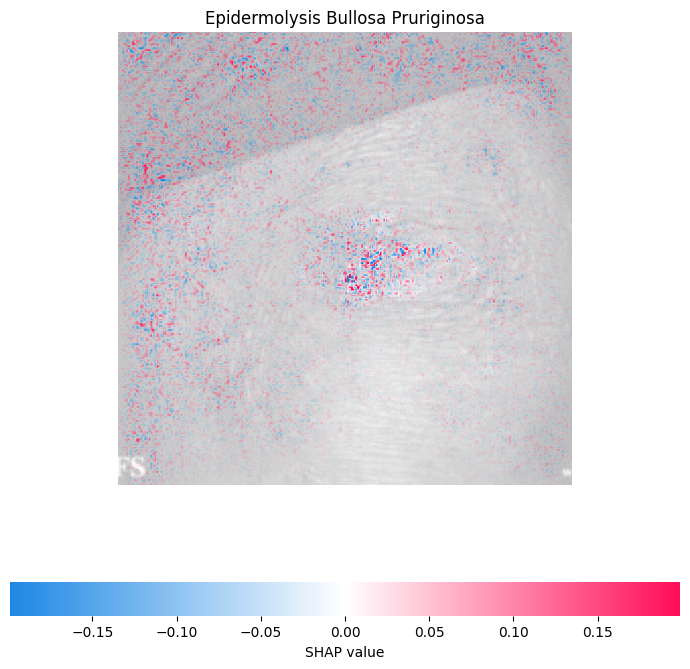

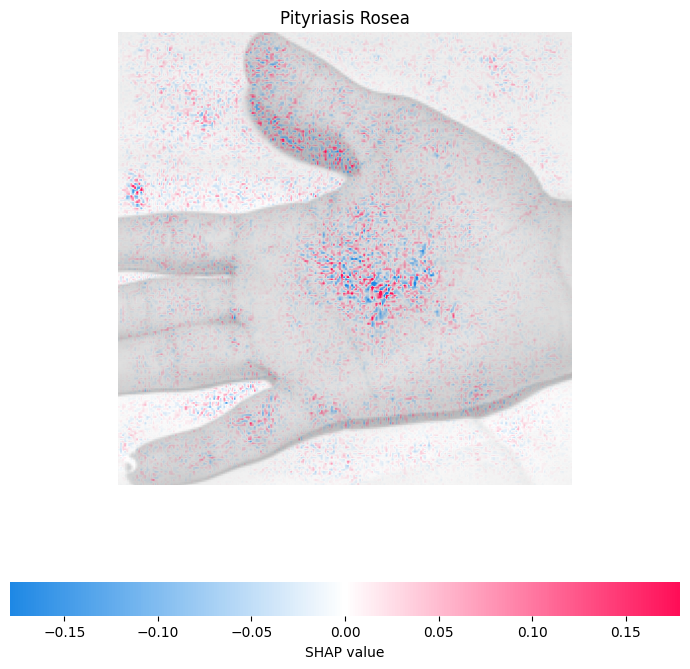

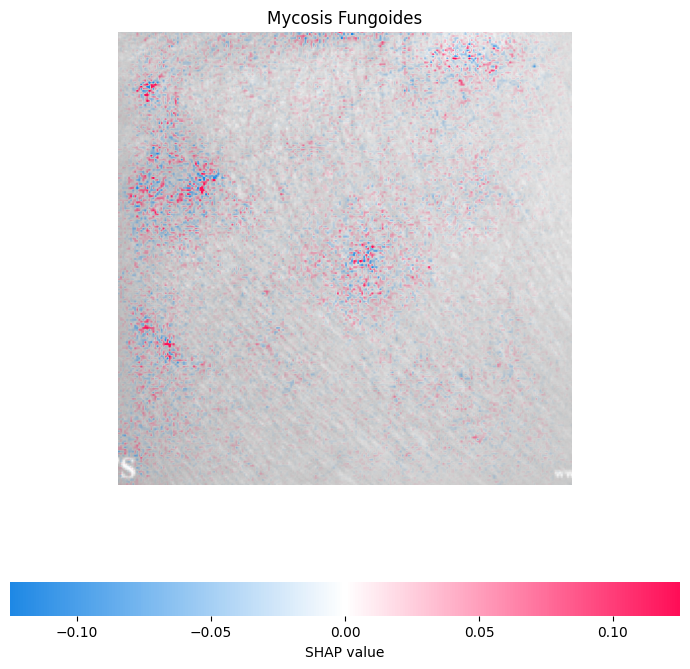

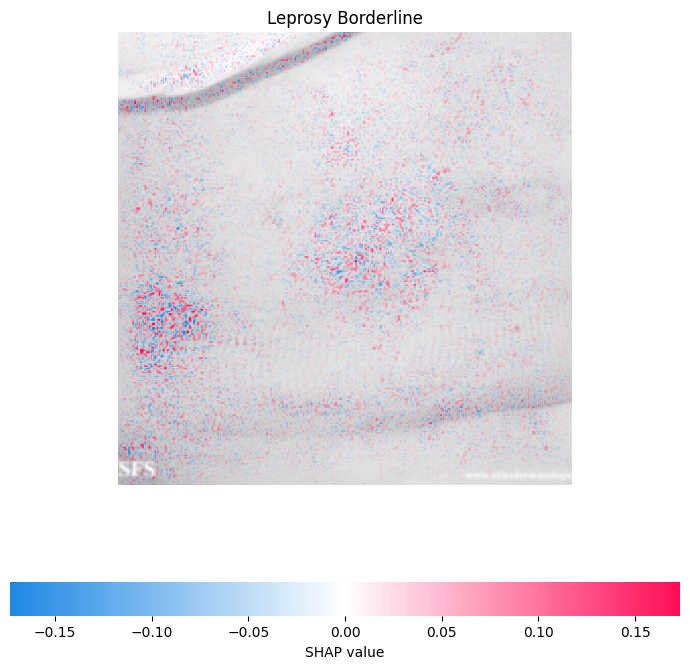

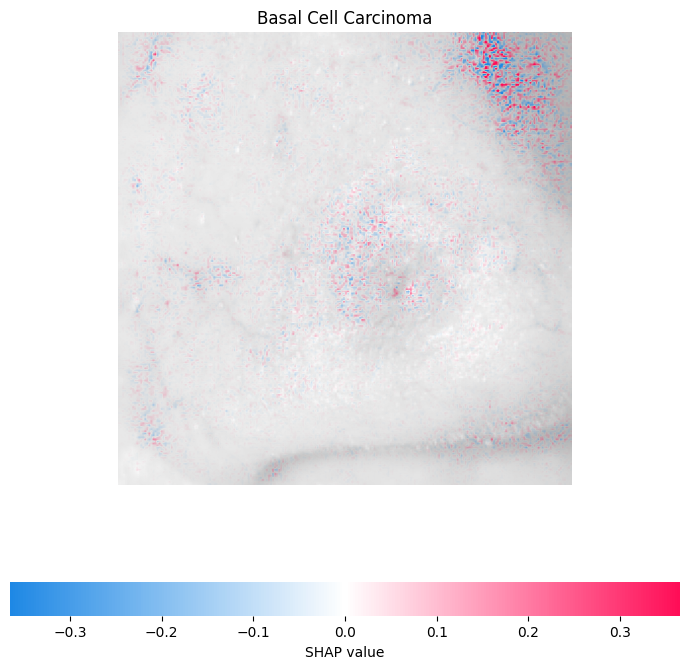

In [32]:
import matplotlib.pyplot as pl
from shap.plots import colors

for idx, x in enumerate(batch[0][num_samples:]):
    label = dls.train.vocab[batch[1][num_samples:]][idx]
    sv_idx = list(dls.train.vocab).index(label)

    # plot our explanations
    fig, axes = pl.subplots(figsize=(7, 7))

    # make sure we have a 2D array for grayscale
    if len(x.shape) == 3 and x.shape[2] == 1:
        x = x.reshape(x.shape[:2])
    if x.max() > 1:
        x /= 255.

    # get a grayscale version of the image
    x_curr_gray = (
        0.2989 * x[0,:,:] +
        0.5870 * x[1,:,:] +
        0.1140 * x[2,:,:]
    )
    x_curr_disp = x

    abs_vals = np.stack(
        [np.abs(shap_values[sv_idx][idx].sum(0))], 0
    ).flatten()
    max_val = np.nanpercentile(abs_vals, 99.9)

    label_kwargs = {'fontsize': 12}
    axes.set_title(label, **label_kwargs)

    sv = shap_values[sv_idx][idx].sum(0)
    axes.imshow(
        x_curr_gray.cpu(),
        cmap=pl.get_cmap('gray'),
        alpha=0.3,
        extent=(-1, sv.shape[1], sv.shape[0], -1)
    )
    im = axes.imshow(
        sv,
        cmap=colors.red_transparent_blue,
        vmin=-max_val,
        vmax=max_val
    )
    axes.axis('off')

    fig.tight_layout()

    cb = fig.colorbar(
        im,
        ax=np.ravel(axes).tolist(),
        label="SHAP value",
        orientation="horizontal"
    )
    cb.outline.set_visible(False)
    pl.show()

In [33]:
del model, learn
gc.collect()

37709

## EfficientNetB2 Aug

In [34]:
arch = "efficientnet_b2"
model = timm.create_model(arch, pretrained=False, in_chans=3, num_classes=dls.c)
learn = Learner(dls, model, metrics=[accuracy,Precision(average='macro'), Recall(average='macro'), F1Score(average='macro')])
learn.load("/content/drive/MyDrive/SkinDisease/efficientnet_aug")

In [35]:
preds = learn.get_preds()
pred_class = preds[0].max(1).indices
tgts = preds[1]

for i, name in enumerate(dls.train.vocab):
    idx = torch.nonzero(tgts==i)
    subset = (tgts == pred_class)[idx]
    acc = subset.squeeze().float().mean()
    print(f'{name}: {acc:.1%}')

Basal Cell Carcinoma: 92.9%
Darier_s Disease: 75.0%
Epidermolysis Bullosa Pruriginosa: 85.0%
Hailey-Hailey Disease: 86.2%
Herpes Simplex: 72.2%
Impetigo: 63.6%
Larva Migrans: 92.9%
Leprosy Borderline: 65.5%
Leprosy Lepromatous: 83.1%
Leprosy Tuberculoid: 72.3%
Lichen Planus: 92.6%
Lupus Erythematosus Chronicus Discoides: 82.6%
Melanoma: 84.6%
Molluscum Contagiosum: 85.2%
Mycosis Fungoides: 79.2%
Neurofibromatosis: 94.4%
Papilomatosis Confluentes And Reticulate: 88.9%
Pediculosis Capitis: 100.0%
Pityriasis Rosea: 80.8%
Porokeratosis Actinic: 96.2%
Psoriasis: 100.0%
Tinea Corporis: 65.2%
Tinea Nigra: 91.7%
Tungiasis: 100.0%
actinic keratosis: 19.2%
dermatofibroma: 95.7%
nevus: 68.0%
pigmented benign keratosis: 88.5%
seborrheic keratosis: 75.0%
squamous cell carcinoma: 60.0%
vascular lesion: 96.6%


In [36]:
# specify how many images to use when creating the background distribution
num_samples = 6
explainer = shap.GradientExplainer(
    learn.model, batch[0][:num_samples]
)

# calculate shapely values
shap_values = explainer.shap_values(
    batch[0][num_samples:]
)

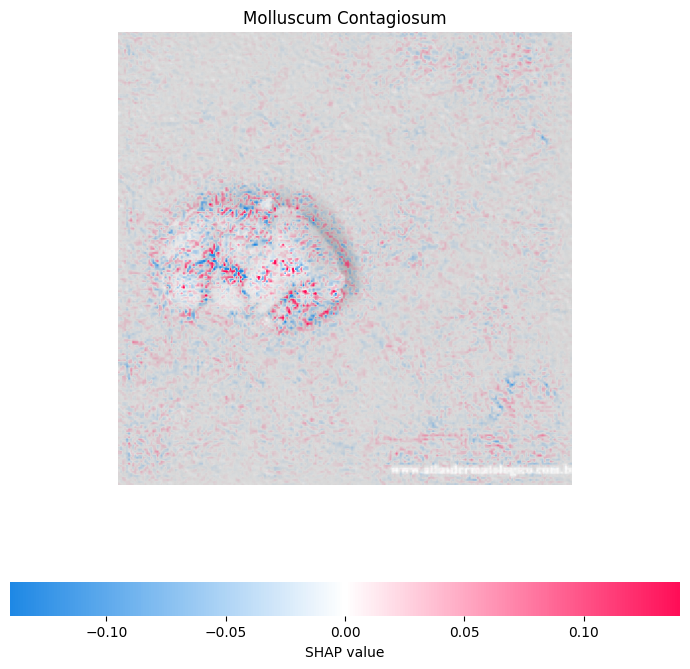

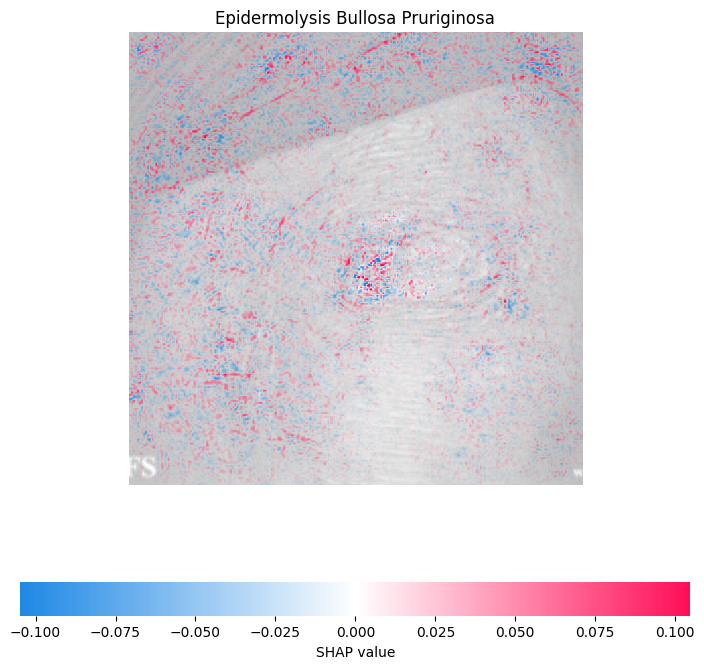

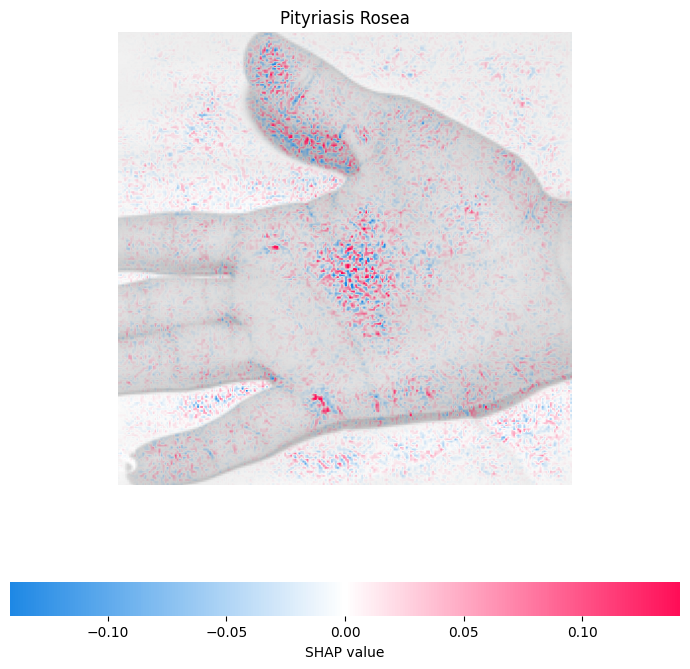

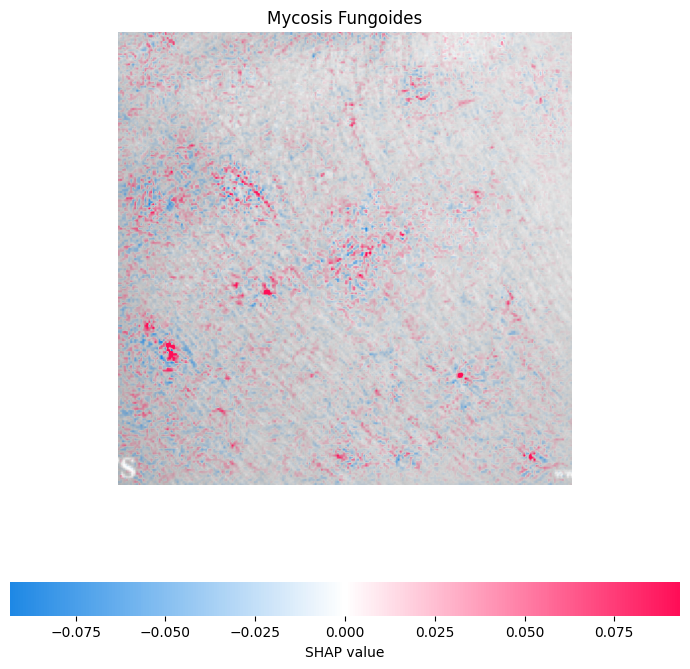

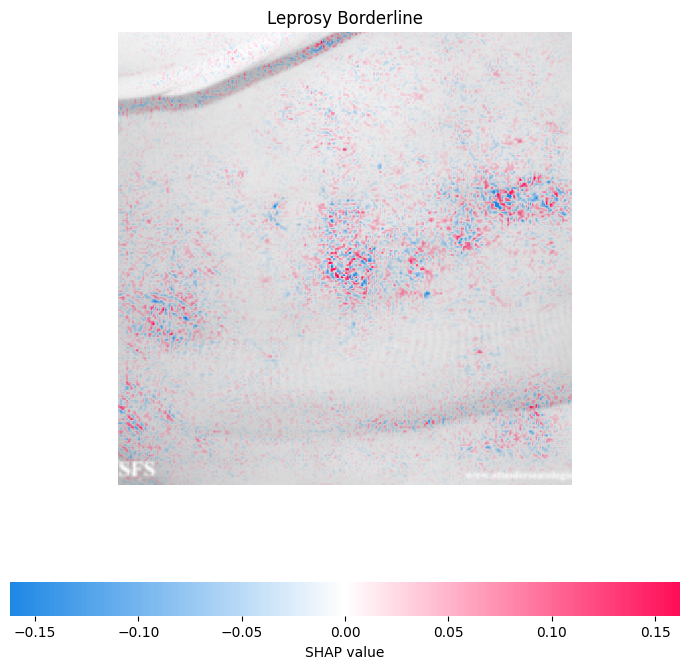

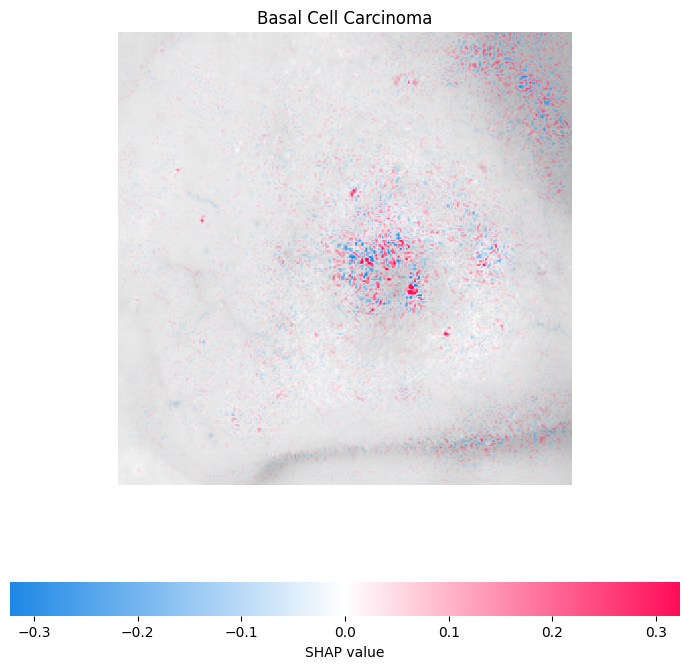

In [37]:
import matplotlib.pyplot as pl
from shap.plots import colors

for idx, x in enumerate(batch[0][num_samples:]):
    label = dls.train.vocab[batch[1][num_samples:]][idx]
    sv_idx = list(dls.train.vocab).index(label)

    # plot our explanations
    fig, axes = pl.subplots(figsize=(7, 7))

    # make sure we have a 2D array for grayscale
    if len(x.shape) == 3 and x.shape[2] == 1:
        x = x.reshape(x.shape[:2])
    if x.max() > 1:
        x /= 255.

    # get a grayscale version of the image
    x_curr_gray = (
        0.2989 * x[0,:,:] +
        0.5870 * x[1,:,:] +
        0.1140 * x[2,:,:]
    )
    x_curr_disp = x

    abs_vals = np.stack(
        [np.abs(shap_values[sv_idx][idx].sum(0))], 0
    ).flatten()
    max_val = np.nanpercentile(abs_vals, 99.9)

    label_kwargs = {'fontsize': 12}
    axes.set_title(label, **label_kwargs)

    sv = shap_values[sv_idx][idx].sum(0)
    axes.imshow(
        x_curr_gray.cpu(),
        cmap=pl.get_cmap('gray'),
        alpha=0.3,
        extent=(-1, sv.shape[1], sv.shape[0], -1)
    )
    im = axes.imshow(
        sv,
        cmap=colors.red_transparent_blue,
        vmin=-max_val,
        vmax=max_val
    )
    axes.axis('off')

    fig.tight_layout()

    cb = fig.colorbar(
        im,
        ax=np.ravel(axes).tolist(),
        label="SHAP value",
        orientation="horizontal"
    )
    cb.outline.set_visible(False)
    pl.show()

In [38]:
del model, learn
gc.collect()

34565

## ConvNeXt

In [ ]:
del shap_values,explainer

In [ ]:
del abs_vals

In [ ]:
arch = "convnext_large_in22k"
model = timm.create_model(arch, pretrained=False, in_chans=3, num_classes=92)
learn = Learner(dls, model, metrics=[accuracy,Precision(average='macro'), Recall(average='macro'), F1Score(average='macro')])
learn.load("/content/drive/MyDrive/RS_NS92_Codes/ModelWeights/convnext_large_in22k")

Saved filed doesn't contain an optimizer state.


In [ ]:
preds = learn.get_preds()
pred_class = preds[0].max(1).indices
tgts = preds[1]

for i, name in enumerate(dls.train.vocab):
    idx = torch.nonzero(tgts==i)
    subset = (tgts == pred_class)[idx]
    acc = subset.squeeze().float().mean()
    print(f'{name}: {acc:.1%}')

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.


airplane: 0.0%
church: 0.0%
harbor: 0.0%
island: 0.0%
sparseresidential: 0.0%
tenniscourt: 0.0%


In [ ]:
# specify how many images to use when creating the background distribution
num_samples = 2
explainer = shap.GradientExplainer(
    learn.model, batch[0][:num_samples]
)

# calculate shapely values
shap_values = explainer.shap_values(
    batch[0][num_samples:]
)

OutOfMemoryError: ignored

In [ ]:
import matplotlib.pyplot as pl
from shap.plots import colors

for idx, x in enumerate(batch[0][num_samples:]):
    label = dls.train.vocab[batch[1][num_samples:]][idx]
    sv_idx = list(dls.train.vocab).index(label)

    # plot our explanations
    fig, axes = pl.subplots(figsize=(7, 7))

    # make sure we have a 2D array for grayscale
    if len(x.shape) == 3 and x.shape[2] == 1:
        x = x.reshape(x.shape[:2])
    if x.max() > 1:
        x /= 255.

    # get a grayscale version of the image
    x_curr_gray = (
        0.2989 * x[0,:,:] +
        0.5870 * x[1,:,:] +
        0.1140 * x[2,:,:]
    )
    x_curr_disp = x

    abs_vals = np.stack(
        [np.abs(shap_values[sv_idx][idx].sum(0))], 0
    ).flatten()
    max_val = np.nanpercentile(abs_vals, 99.9)

    label_kwargs = {'fontsize': 12}
    axes.set_title(label, **label_kwargs)

    sv = shap_values[sv_idx][idx].sum(0)
    axes.imshow(
        x_curr_gray.cpu(),
        cmap=pl.get_cmap('gray'),
        alpha=0.3,
        extent=(-1, sv.shape[1], sv.shape[0], -1)
    )
    im = axes.imshow(
        sv,
        cmap=colors.red_transparent_blue,
        vmin=-max_val,
        vmax=max_val
    )
    axes.axis('off')

    fig.tight_layout()

    cb = fig.colorbar(
        im,
        ax=np.ravel(axes).tolist(),
        label="SHAP value",
        orientation="horizontal"
    )
    cb.outline.set_visible(False)
    pl.show()